In [1]:
from diffusers import ControlNetModel, AutoencoderKL
from pipeline_seg_controlnet import StableDiffusionXLSEGControlNetPipeline
import torch
from diffusers.utils import load_image, make_image_grid
from PIL import Image
import torch
import numpy as np
import cv2
from transformers import DPTFeatureExtractor, DPTForDepthEstimation

/home/susung/ENTER/envs/diffusers/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
condition = "depth"
if condition == "canny":
    controlnet = ControlNetModel.from_pretrained(
        "diffusers/controlnet-canny-sdxl-1.0",
        torch_dtype=torch.float16
    )
elif condition == "depth":
    depth_estimator = DPTForDepthEstimation.from_pretrained("Intel/dpt-hybrid-midas").to("cuda")
    feature_extractor = DPTFeatureExtractor.from_pretrained("Intel/dpt-hybrid-midas")
    controlnet = ControlNetModel.from_pretrained(
        "diffusers/controlnet-depth-sdxl-1.0",
        torch_dtype=torch.float16
    )

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = StableDiffusionXLSEGControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    vae=vae,
    torch_dtype=torch.float16,
)
pipe.enable_model_cpu_offload()

/home/susung/ENTER/envs/diffusers/lib/python3.9/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
/home/susung/ENTER/envs/diffusers/lib/python3.9/site-packages/transformers/models/dpt/feature_extraction_dpt.py:28: FutureWarning: The class DPTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DPTImageProcessor instead.
  warnings.warn(
Loading pipeline components...: 100%|██████████| 7/7 [00:02<00:00,  3.38it/s]


In [3]:
image_name = f"figures/example.jpg"

if condition == "canny":
    image = load_image(image_name)

    image = np.array(image)
    image = cv2.Canny(image, 100, 200)
    image = image[:, :, None]
    image = np.concatenate([image, image, image], axis=2)
    image = Image.fromarray(image)

elif condition == "depth":
    
    def get_depth_map(image):
        image = feature_extractor(images=image, return_tensors="pt").pixel_values.to("cuda")
        with torch.no_grad(), torch.autocast("cuda"):
            depth_map = depth_estimator(image).predicted_depth

        depth_map = torch.nn.functional.interpolate(
            depth_map.unsqueeze(1),
            size=(1024, 1024),
            mode="bicubic",
            align_corners=False,
        )
        depth_min = torch.amin(depth_map, dim=[1, 2, 3], keepdim=True)
        depth_max = torch.amax(depth_map, dim=[1, 2, 3], keepdim=True)
        depth_map = (depth_map - depth_min) / (depth_max - depth_min)
        image = torch.cat([depth_map] * 3, dim=1)

        image = image.permute(0, 2, 3, 1).cpu().numpy()[0]
        image = Image.fromarray((image * 255.0).clip(0, 255).astype(np.uint8))
        return image
    image = load_image(image_name)
    image = get_depth_map(image)



In [4]:
prompt = ""
negative_prompt = ""
seed = 10
controlnet_conditioning_scale = 0.5

100%|██████████| 25/25 [00:13<00:00,  1.81it/s]


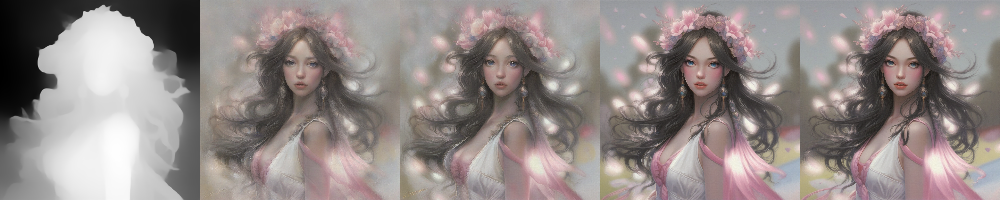

In [5]:
output = []
output.append(image)

# Original
generator = torch.Generator(device="cuda").manual_seed(seed)
output += pipe(
        prompt,
        negative_prompt=negative_prompt,
        image=image,
        controlnet_conditioning_scale=controlnet_conditioning_scale,
        num_inference_steps=25,
        guidance_scale=1.0,
        seg_scale=0.0,
        seg_blur_sigma=0.0,
        seg_applied_layers=['mid'],
        generator=generator,
    ).images

# PEG
generator = torch.Generator(device="cuda").manual_seed(seed)
output += pipe(
        prompt,
        negative_prompt=negative_prompt,
        image=image,
        controlnet_conditioning_scale=controlnet_conditioning_scale,
        num_inference_steps=25,
        guidance_scale=1.0,
        seg_scale=3.0,
        seg_blur_sigma=1.0,
        seg_applied_layers=['mid'],
        generator=generator,
    ).images
generator = torch.Generator(device="cuda").manual_seed(seed)
output += pipe(
        prompt,
        negative_prompt=negative_prompt,
        image=image,
        controlnet_conditioning_scale=controlnet_conditioning_scale,
        num_inference_steps=25,
        guidance_scale=1.0,
        seg_scale=3.0,
        seg_blur_sigma=10.0,
        seg_applied_layers=['mid'],
        generator=generator,
    ).images
generator = torch.Generator(device="cuda").manual_seed(seed)
output += pipe(
        prompt,
        negative_prompt=negative_prompt,
        image=image,
        controlnet_conditioning_scale=controlnet_conditioning_scale,
        num_inference_steps=25,
        guidance_scale=1.0,
        seg_scale=3.0,
        seg_blur_sigma=10000000000.0,
        seg_applied_layers=['mid'],
        generator=generator,
    ).images

grid = make_image_grid(output, rows=1, cols=5)
grid